In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle
import matplotlib.image as mpimg
%matplotlib qt




In [2]:


num_y = 9
num_x = 6
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((num_x*num_y,3), np.float32)
objp[:,:2] = np.mgrid[0:num_y, 0:num_x].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (num_y,num_x), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (num_y,num_x), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

Text(0.5, 1.0, 'Undistorted Image')

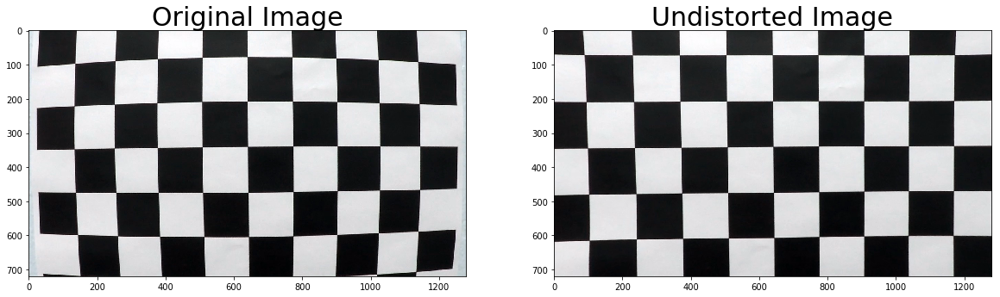

In [3]:
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('output_images/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "cal_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

Text(0.5, 1.0, 'Undistorted Image')

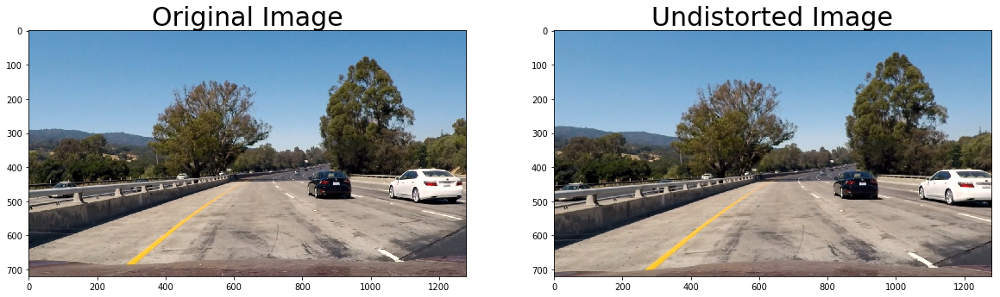

In [4]:
# Test undistortion on an image
img = cv2.imread('test_images/test1.jpg')
img_size = (img.shape[1], img.shape[0])

dst = cv2.undistort(img, mtx, dist, None, mtx)


img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
cv2.imwrite('output_images/test2_undist.jpg',dst)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

In [6]:
#source vertices of region for perspective transform
src_left_top = [int(img_size[0] / 2 - 58), int(img_size[1] / 2 + 100)]
src_right_top = [int(img_size[0] / 2 + 65), int(img_size[1] / 2 + 100)]
src_right_bottom = [int(img_size[0] * 5 / 6) + 35, img_size[1]]
src_left_bottom = [int((img_size[0] / 6) ), img_size[1]]

perspective_src_vertices = np.float32([src_left_top, src_right_top, src_right_bottom, src_left_bottom])      

#destincation vertices of region for perspective transform
dst_left_top = [int(img_size[0] / 4), 0]
dst_right_top = [int(img_size[0] * 3 / 4), 0]
dst_right_bottom = [int(img_size[0] * 3 / 4), img_size[1]]
dst_left_bottom = [int(img_size[0] / 4), img_size[1]]

perspective_dst_vertices = np.float32([dst_left_top, dst_right_top, dst_right_bottom, dst_left_bottom])  

#region of interest for lane lines detection
roi_left_top = [551,450]
roi_right_top = [729,450]
roi_right_bottom = [1253,694]
roi_left_bottom = [27,694]

roi_vertices = np.array([[roi_left_top, roi_right_top, roi_right_bottom, roi_left_bottom]], dtype=np.int32)

In [7]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [10]:
def perspective_transform(img, mtx, dist, src, dst):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

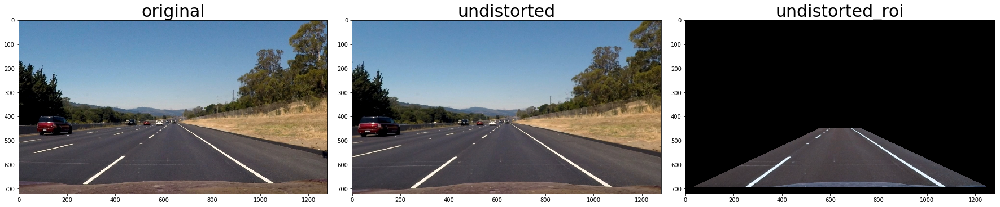

In [8]:
fname = 'test_images/straight_lines2.jpg'
img = cv2.imread(fname)
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

undistorted_roi = region_of_interest(undistorted, roi_vertices)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
undistorted = cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB)
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('original', fontsize=30)
ax2.imshow(undistorted, cmap='gray')
ax2.set_title('undistorted', fontsize=30)
ax3.imshow(undistorted_roi, cmap='gray')
ax3.set_title('undistorted_roi', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [11]:
warped, M, Minv = perspective_transform(undistorted_roi, mtx, dist, perspective_src_vertices, perspective_dst_vertices)

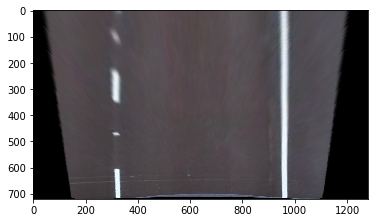

In [12]:
plt.imshow(warped)

In [13]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # x gradient sobel
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) # y gradient sobel
    # Take the absolute value of the gradient direction, apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output

def s_thresh(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    binary_output = np.zeros_like(s)
    binary_output[(s >= thresh[0]) & (s <= thresh[1])] = 1    
    return binary_output

Text(0.5, 1.0, 'Undistorted Image')

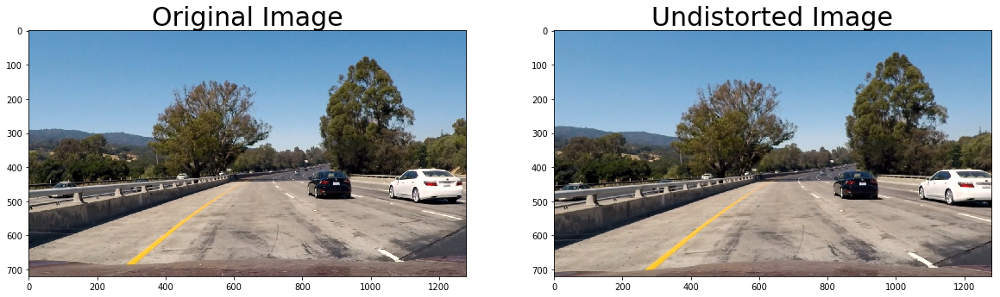

In [14]:
fname = 'test_images/test1.jpg'
img = cv2.imread(fname)
undistorted = cv2.undistort(img, mtx, dist, None, mtx)
undistorted_roi = region_of_interest(undistorted, roi_vertices)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
undistorted = cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

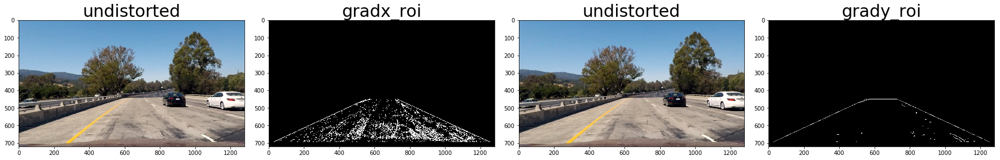

In [15]:
gradx = abs_sobel_thresh(undistorted_roi, orient='x', sobel_kernel=3, thresh=(10, 235))
grady = abs_sobel_thresh(undistorted_roi, orient='y', sobel_kernel=3, thresh=(50, 255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted)
ax1.set_title('undistorted', fontsize=30)
ax2.imshow(gradx,cmap='gray')
ax2.set_title('gradx_roi', fontsize=30)
ax3.imshow(undistorted, cmap='gray')
ax3.set_title('undistorted', fontsize=30)
ax4.imshow(grady, cmap='gray')
ax4.set_title('grady_roi', fontsize=30)    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

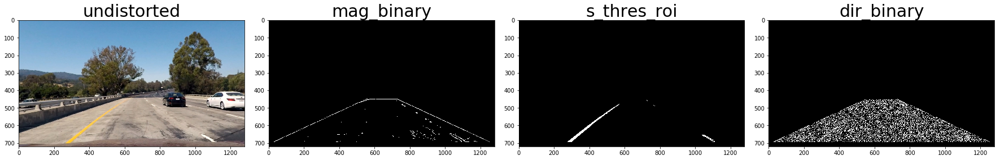

In [16]:
mag_binary = mag_thresh(undistorted_roi, sobel_kernel=3, mag_thresh=(40, 200))
dir_binary = dir_thresh(undistorted_roi, sobel_kernel=3, thresh=(0.7, 1.2))
s_binary = s_thresh(undistorted_roi, thresh=(180, 255))

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(undistorted)
ax1.set_title('undistorted', fontsize=30)
ax2.imshow(mag_binary,cmap='gray')
ax2.set_title('mag_binary', fontsize=30)
ax3.imshow(s_binary, cmap='gray')
ax3.set_title('s_thres_roi', fontsize=30)
ax4.imshow(dir_binary, cmap='gray')
ax4.set_title('dir_binary', fontsize=30)    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [17]:
def combined_edge_detection(img):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(10, 235))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=3, thresh=(50, 255))
    mag_binary = mag_thresh(img, sobel_kernel=3, mag_thresh=(40, 200))
    dir_binary = dir_thresh(img, sobel_kernel=3, thresh=(0.7, 1.2))
    s_binary = s_thresh(img, thresh=(180, 255))
    combined = np.zeros_like(gradx)
    combined[ (s_binary == 1) | ((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

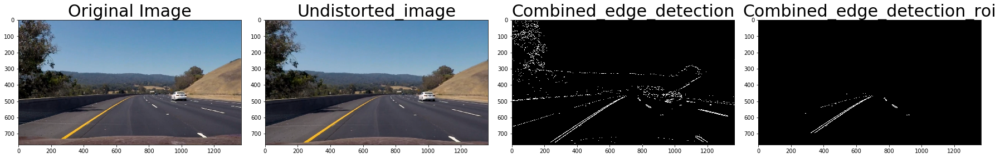

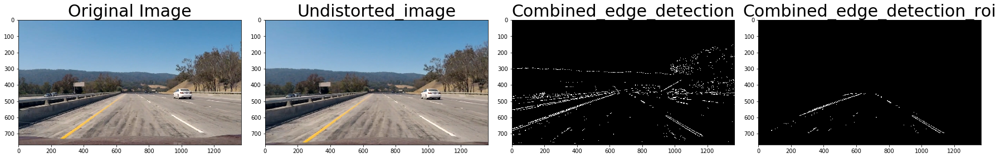

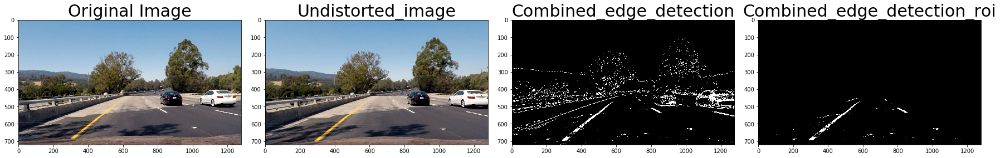

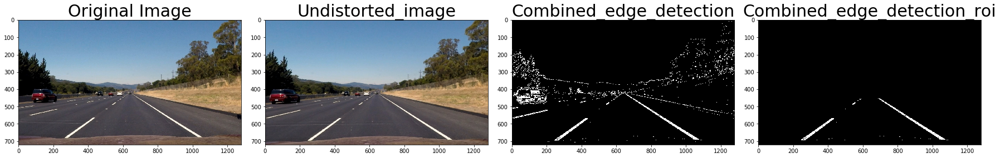

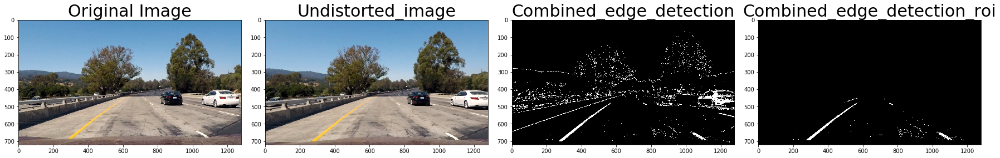

...

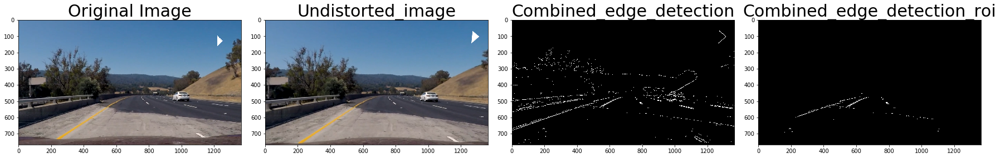

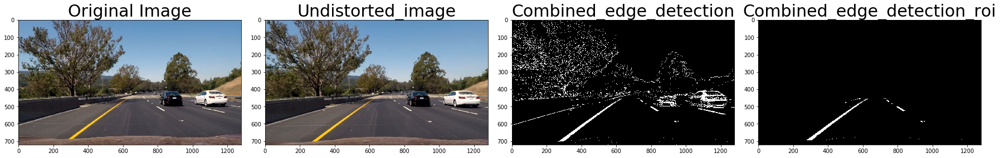

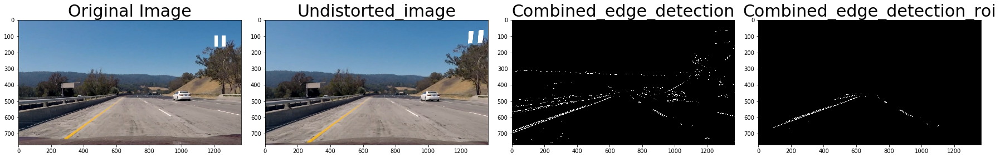

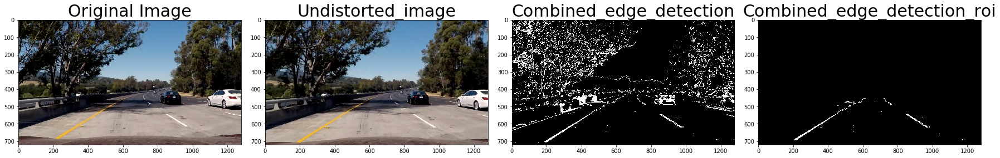

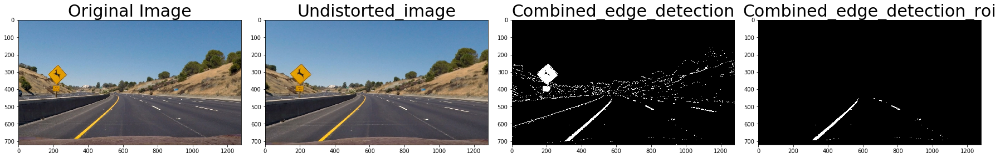

In [18]:
import os

images = os.listdir('./test_images')  
for fname in images:
    fname = os.path.join('test_images',fname)
    test_img = mpimg.imread(fname)
    undistorted = cv2.undistort(test_img, mtx, dist, None, mtx)
    combined = combined_edge_detection(undistorted)  
    combined_roi = region_of_interest(combined, roi_vertices)
    
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(test_img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undistorted,cmap='gray')
    ax2.set_title('Undistorted_image', fontsize=30)
    ax3.imshow(combined, cmap='gray')
    ax3.set_title('Combined_edge_detection', fontsize=30)
    ax4.imshow(combined_roi, cmap='gray')
    ax4.set_title('Combined_edge_detection_roi', fontsize=30)    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [19]:
def histogram_analysis(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    return leftx, lefty, rightx, righty, out_img

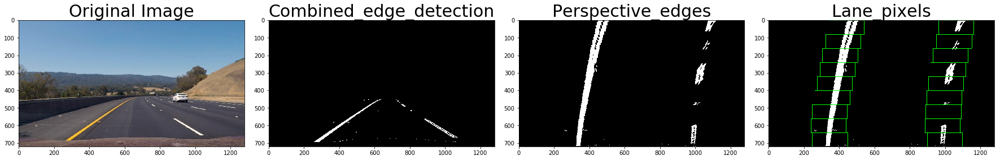

In [20]:

fname = 'test_images/test3.jpg'
img = cv2.imread(fname)
img_cal = cv2.undistort(img, mtx, dist, None, mtx)   
combined = combined_edge_detection(img_cal)    
combined = region_of_interest(combined, roi_vertices) 
warped, M, Minv  = perspective_transform(combined, mtx, dist, perspective_src_vertices, perspective_dst_vertices)
leftx, lefty, rightx, righty, out_img = histogram_analysis(warped)

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(combined,cmap='gray')
ax2.set_title('Combined_edge_detection', fontsize=30)
ax3.imshow(warped, cmap='gray')
ax3.set_title('Perspective_edges', fontsize=30)
ax4.imshow(out_img, cmap='gray')
ax4.set_title('Lane_pixels', fontsize=30)    
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [30]:
def pipeline(img):
    
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img[:,:,0] = cv2.equalizeHist(img[:,:,0])
    img = cv2.cvtColor(img, cv2.COLOR_YUV2RGB)
    img = cv2.undistort(img, mtx, dist, None, mtx)   
    combined = combined_edge_detection(img)    
    combined = region_of_interest(combined, roi_vertices) 
    warped, M, Minv  = perspective_transform(combined, mtx, dist, perspective_src_vertices, perspective_dst_vertices)
    leftx, lefty, rightx, righty, out_img = histogram_analysis(warped)
    
    y = np.linspace(0, img.shape[0], num=img.shape[0])# to cover same y-range as image
    
    ## Fit a second order polynomial to pixel positions 
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*y**2 + left_fit[1]*y + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*y**2 + right_fit[1]*y + right_fit[2]

    ## Find lane radius of curvature (m) 
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension 
    xm_per_pix = 3.7/700 # meters per pixel in x dimension 

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(y)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    cv2.putText(img,'Radius of curvature: '  + str(left_curverad)[:6] + ' m',(20,40), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    
    ## Find center position 
    left_mean = np.mean(leftx)
    right_mean = np.mean(rightx)
    center = warped.shape[1]/2 - np.mean([left_mean, right_mean])
    
    cv2.putText(img,'Center: '  + str(center*xm_per_pix)[:6] + ' m',(20,80), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2 )
    
    ## DRAW LANE 
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, y])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    return result

# Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!
left_fit = np.array([ 2.13935315e-04, -3.77507980e-01,  4.76902175e+02])
right_fit = np.array([4.17622148e-04, -4.93848953e-01,  1.11806170e+03])

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(img):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100
    
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img[:,:,0] = cv2.equalizeHist(img[:,:,0])
    img = cv2.cvtColor(img, cv2.COLOR_YUV2RGB)
    img = cv2.undistort(img, mtx, dist, None, mtx)   
    combined = combined_edge_detection(img)    
    combined = region_of_interest(combined, roi_vertices) 
    binary_warped, M, Minv  = perspective_transform(combined, mtx, dist, perspective_src_vertices, perspective_dst_vertices)
    
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Find lane radius of curvature (m) 
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension 
    xm_per_pix = 3.7/700 # meters per pixel in x dimension 
    
    y = np.linspace(0, img.shape[0], num=img.shape[0])
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(y)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    cv2.putText(img,'Radius of curvature: '  + str(left_curverad)[:6] + ' m',(20,40), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    
    ## Find center position 
    left_mean = np.mean(leftx)
    right_mean = np.mean(rightx)
    center = warped.shape[1]/2 - np.mean([left_mean, right_mean])
    
    cv2.putText(img,'Center: '  + str(center*xm_per_pix)[:6] + ' m',(20,80), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2 )
    
    ## DRAW LANE 
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, y])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    return result

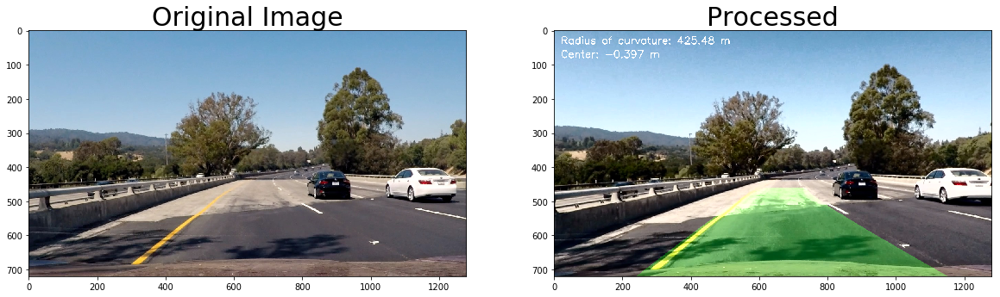

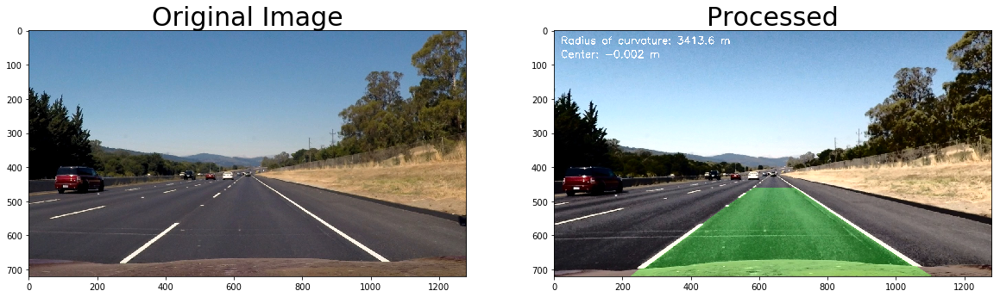

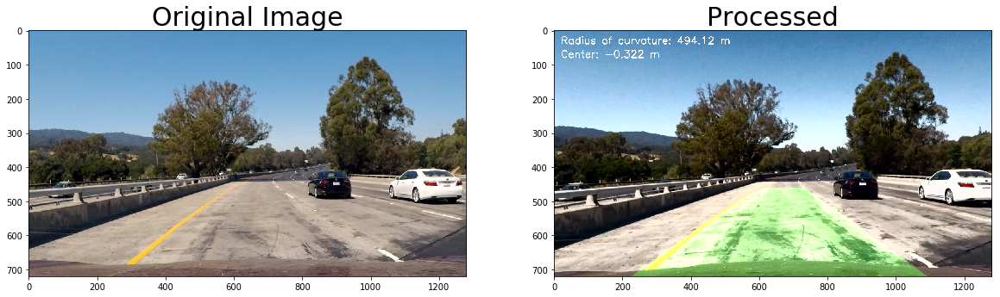

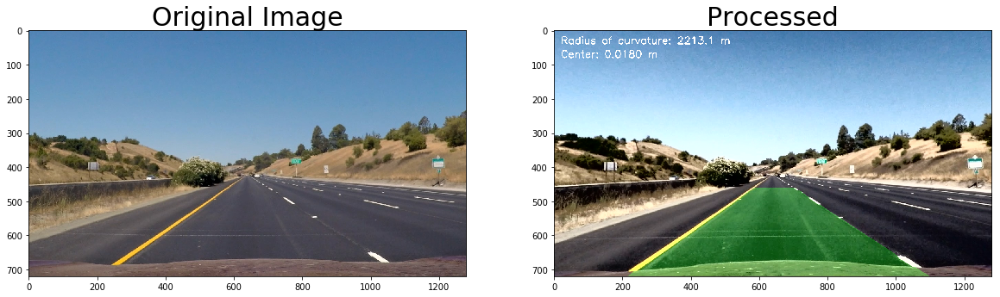

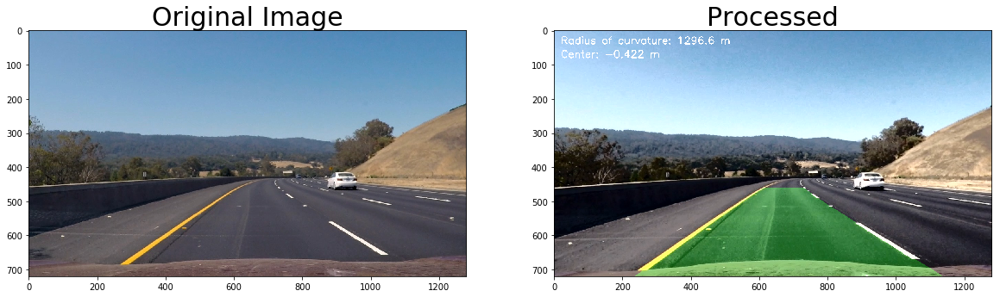

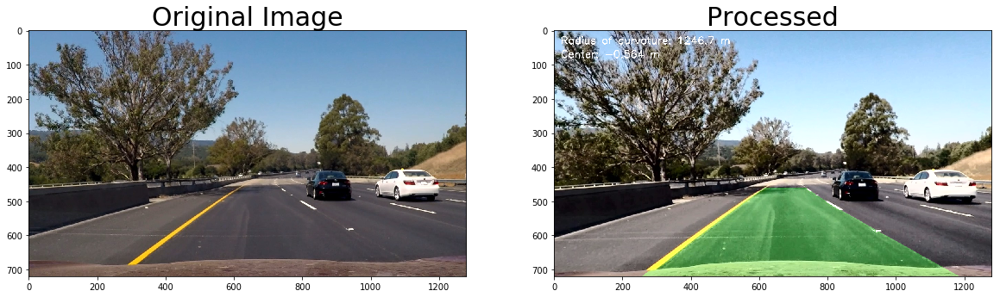

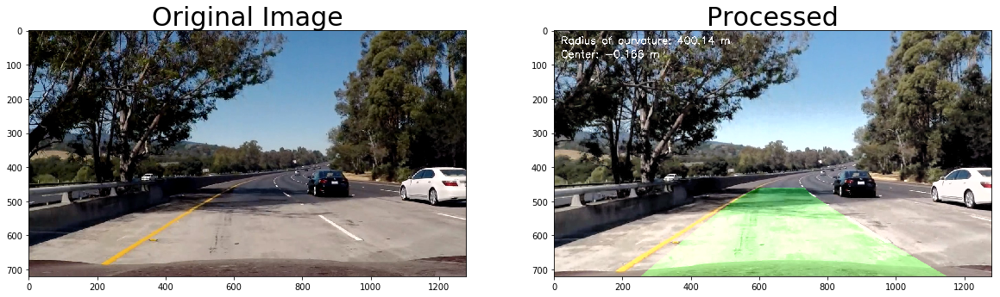

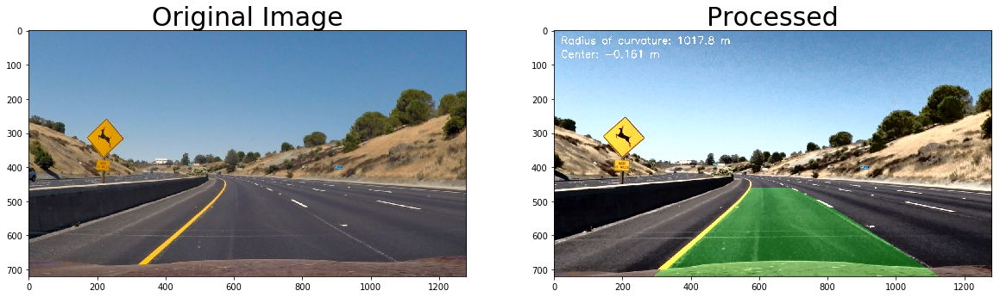

In [31]:
# Test full pipeline rendering
import os

images = os.listdir('./test_images')  
for fname in images:
    fname = os.path.join('test_images',fname)
    img = mpimg.imread(fname)   
    result = search_around_poly(img)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(result)
    ax2.set_title('Processed', fontsize=30)

In [33]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

write_output = 'project_video_out_2.mp4'
clip1 = VideoFileClip("project_video.mp4")
write_clip = clip1.fl_image(search_around_poly) #NOTE: this function expects color images!!
%time write_clip.write_videofile(write_output, audio=False)

[MoviePy] >>>> Building video project_video_out_2.mp4
[MoviePy] Writing video project_video_out_2.mp4


100%|█████████▉| 1260/1261 [07:40<00:00,  2.87it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out_2.mp4 

CPU times: user 17min 53s, sys: 5.79 s, total: 17min 59s
Wall time: 7min 43s
